In [45]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import os
from datetime import datetime

# 0. Define In- and Output-Data

### 0.1 General Helpers:

In [46]:

# 0.1 Definition input-data als variables; need to be defined in main:
# output_folder_name = 'test'
# granularity = str # months, weeks, year
# min_time_step = int
# max_time_step = int
# visualized_assets = list
# assets_for_share = list

#### kann weg!

In [47]:
# helper functions for showing data correctly:
def print_df(df: pd.DataFrame):
    """_summary_Ergebnisse des ergänzten Dataframes werden übersichtlich 
    in Output dargestellt.

    Args:
        df (pd.DataFrame): Dataframe for visualization
    """
    
    df.columns = df.columns.str.replace(' ', '')
    
    # Spaltenbreite bestimmen (einschließlich Index)
    widths = [max(len("t"), 10)] + [max(len(str(x)), 20) for x in df.columns]

    # Header zentrieren (inklusive "Index" als Spaltenindex)
    header = " | ".join(str(col).center(width) for col, width in zip(["t"] + list(df.columns), widths))

    # Werte zentrieren (inklusive Zeilenindex)
    rows = "\n".join(
    " | ".join(str(val).center(width) for val, width in zip([index] + list(row), widths))
    for index, row in zip(df.index, df.values)
    )

    # Zusammenführen und Ausgabe
    print(header)
    print("-" * len(header))  # Trennlinie
    print(rows)
    
def change_energy_units(
    values: list, 
    actual_unit: str, 
    target_unit: str):
    """Iterates through a list of values (int/float) and checks unit. If actual and target units differ it processes 
    all values into new unit and gives back new list as return value.

    Args:
        values (list): power or energy values
        actual_unit (str): actual unit of input values
        target_unit (str): target unit for values

    Returns:
        list: values with intended target unit.
    """
    
    target_values = []
    
    kW_units = ['kW', 'kWh']
    MW_units = ['MW', 'MWh']
    GW_units = ['GW', 'GWh']
    
    for value in values: 
        if actual_unit in kW_units and target_unit in MW_units: 
            target_values.append(round((value / 1000),2))
        elif actual_unit in kW_units and target_unit in GW_units:
            target_values.append(round((value / 1000000),2))
        elif actual_unit in kW_units and target_unit in kW_units:
            target_values.append(round((value),2))
        elif actual_unit in MW_units and target_unit in GW_units:
            target_values.append(round((value / 1000),2))
        elif actual_unit in MW_units and target_unit in kW_units:
            target_values.append(round((value * 1000),2))
        elif actual_unit in MW_units and target_unit in MW_units:
            target_values.append(round((value),2))
        elif actual_unit in GW_units and target_unit in MW_units:
            target_values.append(round((value * 1000),2))
        elif actual_unit in GW_units and target_unit in kW_units:
            target_values.append(round((value * 1000000),2))
        elif actual_unit in GW_units and target_unit in GW_units:
            target_values.append(round((value),2))
        else: 
            print("Unit not found. Check Spelling.")
            return
    
    # print(f"Calculation done for actual unit: {actual_unit} to target unit: {target_unit}")

    return target_values

# Funktion zur Bestimmung der Kalenderwoche basierend auf dem Startdatum
def get_weeks_from_startdate(timestamps: list):
    """generates weeks from input-dates. Useful for plotting diagrams based on weeks and not months.

    Args:
        timestamps (list): _description_
        year (int): _description_

    Returns:
        list: _description_
    """
    weeks = []
    for ts in timestamps:
        start_str = ts.split('/')[0]  # Nur der Startwert vor dem '/'
        # Startdatum in datetime konvertieren
        start_date = datetime.strptime(start_str, "%Y-%m-%d")
        # Kalenderwoche abrufen
        start_week = start_date.isocalendar()[1]
        weeks.append(start_week)
    return weeks


def get_months_from_date(timestamps: list, year: int):
    """_summary_

    Args:
        timestamps (list): input timestamps in list
        year (int): set year as input

    Returns:
        list: converted list with months as numbers
    """
    months = [date.replace(f'{year}-', '') for date in timestamps]
    return months
    


In [48]:
# # 0.2 Definition Output-Path as new folder for diagram:
# INPUT_PATH = '../data/output/output_time_series.csv'
# OUTPUT_PATH = '../data/postprocessing/' + output_folder_name

# #### kann weg!

### 0.2 Load data function:

In [49]:
# 0.3 Load DataFrame of CSV as input-data: 
def load_csv_results_in_df(
    input_path: str
    ):
    
    input_values_df = pd.read_csv(input_path, index_col=0)
    print_df(input_values_df)
    return input_values_df


# 1. Functions for filtering and calculating values for set granularity (months, weeks, etc.)

In [50]:
def filter_time_range(
    df = pd.DataFrame, 
    start_date = str, 
    end_date = str, 
    time_column = str):
    """Insert Dates (YYYY-MM-DD) in DataFrame and filter after given start and end date.

    Args:
        df (_type_, optional): Input Dataframe from results. Defaults to pd.DataFrame.
        start_date (_type_, optional): first date for filtering. Defaults to str.
        end_date (_type_, optional): end date for filtering. Defaults to str.
        time_column (str, optional): name of column with time steps. Defaults to str.

    Returns:
        _type_: pd.DataFrame
    """
    # Create List of dates and hours belonging to timestep:
    dates = list(pd.date_range('2025-01-01', periods=8784, freq='H'))
    input_values_df.insert(0, 'date', dates, allow_duplicates=False)
    df[time_column] = pd.to_datetime(df[time_column])
    
    # LEERZEICHEN bei den Spaltennamen löschen!
    df.columns = df.columns.str.replace(' ', '')
    return df[(df[time_column] >= pd.Timestamp(start_date)) & (df[time_column] <= pd.Timestamp(end_date))]

    # df[time_column] >= pd.Timestamp(start_date): Schließt nur Einträge ein, die nach oder genau am Startdatum liegen
    # df[time_column] <= pd.Timestamp(end_date): Schließt nur Einträge ein, die vor oder genau am Enddatum liegen.

def sums_by_granularity(
    df = pd.DataFrame, 
    granularity = str, 
    time_column=str):
    """group lines of dataframe to given granularity (years, months etc.) and 
    sum up values of columns beginning from second column.

    Args:
        df (_type_, optional): _description_. Defaults to pd.DataFrame.
        granularity (_type_, optional): _description_. Defaults to str.
        time_column (_type_, optional): _description_. Defaults to str.
        value_column (str, optional): _description_. Defaults to 'value'.

    Raises:
        ValueError: if another granularity is given than defined no groups can 
        be formed.

    Returns:
        _type_: filtered DataFrame with relevant time span and granularity. 
    """
    
    df = df.copy()
    df[time_column] = pd.to_datetime(df[time_column])
    if granularity == 'month':
        df['period'] = df[time_column].dt.to_period('M')
    elif granularity == 'year':
        df['period'] = df[time_column].dt.to_period('Y')
    elif granularity == 'week':
        df['period'] = df[time_column].dt.to_period('W')
    elif granularity == 'day':
        df['period'] = df[time_column].dt.to_period('D')
    elif granularity == 'hour':
        df['period'] = df[time_column].dt.to_period('H')
    else:
        raise ValueError("Invalid granularity.")
    
    # berechne die Summen ab der 2. Spalte, Index period wird zurückgesetzt und runde auf 2 Stellen.
    aggregated = df.groupby('period').sum().iloc[:, 2:].reset_index().round(2) 
    aggregated['period'] = aggregated['period'].astype(str)  # Konvertiere die Perioden in String-Format
    
    return aggregated


def process_data(df, start_date, end_date, granularity, time_column='datetime', value_column='value'):
    filtered_df = filter_time_range(df, start_date, end_date, time_column)
    
    return sums_by_granularity(filtered_df, granularity, time_column)


# #### LÖSCHEN: Filter- und Aggregationsparameter # Einfügen bei Aufruf der Funktionen in !Main! unten, dann hier löschen!

# time_sums_df = process_data(df=input_values_df, start_date = '2025-03-01', end_date = '2025-08-31', granularity='month', time_column='date')
# print_df(time_sums_df)


# 2. Function for setting assets and parameters to be visualized

In [51]:
# inputs: 

def extract_assets_to_dict(
    df = pd.DataFrame, 
    selected_assets = tuple, 
    type_of_energy = str):
    """
    Liest bestimmte Spalten zugehörig zu allen relevanten Assets fürs Diagramm aus einem DataFrame 
    aus und speichert sie in einem Dictionary.

    Parameters:
        df (pd.DataFrame): DataFrame, aus dem die Spalten ausgelesen werden.
        selected_assets (tuple): Ein Tuple mit allen Assets, die dargestellt werden sollen.
        type_of_energy (str): Der Typ der Energie, der mit den Assets kombiniert wird.

    Returns:
        dict: Ein Dictionary mit den Spaltennamen als Keys und den Spalteninhalten als Werten.
    """
    # Generiere die vollständigen Spaltennamen
    column_names = [f"{asset}.{type_of_energy}" for asset in selected_assets]

    # Filtere die gewünschten Spalten aus dem DataFrame
    extracted_columns = {col: list(df[col]) for col in column_names if col in df.columns}

    return extracted_columns

def calculate_asset_share_of_supply(
    asset_dict = dict,
    type_of_energy = str, 
    selected_assets = tuple):
    """Berechnet den Anteil der selected assets am Gesamt-Supply aller angegebenen Assets. 

    Args:
        asset_dict (_type_, optional): Anteil der Assets, der am Gesamtbedarf/Supply berechnet werden soll. Defaults to dict.
        selected_assets (_type_, optional): Alle Assets, deren Anteil zusammengefasst werden soll. Defaults to tuple.
        
    Returns:
        dict: Ein Dictionary mit den Spaltennamen als Keys und den Spalteninhalten als Werten. Hinzugefügt wurden Keys der Anteile sowie der Prozentzahlen.
        
    """
    
    # Summiere die Werte der einzelnen Listen nacheinander
    total_key = f"total_supply.{type_of_energy}"
    total_values = [sum(values) for values in zip(*asset_dict.values())]
    
    asset_dict[total_key] = total_values
    
    # Prüfe, ob die ausgewählten Assets in den Keys enthalten sind, 
    # summiere deren Werte und speichere sie im Dict.
    selected_key = f"selected_assets_supply.{type_of_energy}"
    selected_values = [0] * len(total_values)

    for key in asset_dict.keys():
        if any(asset in key for asset in selected_assets):
            selected_values = [sum(values) for values in zip(selected_values, asset_dict[key])]

    asset_dict[selected_key] = selected_values
    
    # Bestimme den Anteil des Supply der Assets am Gesamtwert. 
    share_key = "share_of_assets"
    share_values = [round((selected / total * 100),1) if total != 0 else 0 
                        for selected, total in zip(selected_values, total_values)]
    asset_dict[share_key] = share_values
    
    return asset_dict

def add_period_to_dict(
    df = pd.DataFrame, 
    asset_dict = dict):
    """_summary_

    Args:
        df (pd.DataFrame, optional): Input Dataframe with filtered values and groups. Defaults to pd.DataFrame.
        asset_dict (dict, optional): Dictionary with relevant asset_data from Input Dataframe and shares of assets on supply. Defaults to dict.

    Raises:
        KeyError: period needs to be an column name of DataFrame.

    Returns:
        _type_: dict
    """
    if 'period' in df:
        asset_dict['period'] = df['period'].tolist()
    else: 
        raise KeyError("period not found in df.")
    
    return asset_dict

# #### LÖSCHEN muss später in Main!
# my_assets = ['chp_1', 'chp_2']
# all_considered_assets = ('chp_1', 'chp_2', 'electrolyzer_1', 'electrolyzer_4')
# type_of_energy = 'heat'
# actual_unit = 'MWh'
# target_unit = 'GWh'
# groupname = 'EE' # noch nicht verwendet.

# asset_dict = calculate_asset_share_of_supply(
#     asset_dict=extract_assets_to_dict(df=time_sums_df, selected_assets=all_considered_assets, type_of_energy=type_of_energy),
#     type_of_energy=type_of_energy, 
#     selected_assets=my_assets)

# dict_for_diagrams = add_period_to_dict(df = time_sums_df, asset_dict = asset_dict)
# for key, values in dict_for_diagrams.items():
#     print(f"{key}: {values}")


# 3. Functions for plotting and saving bar chart for share of assets

In [52]:

#### process data for bar charts
# inputs: 
def process_asset_data_for_plot (
    all_data_for_plot: dict,
    actual_unit: str,
    target_unit: str): 
    """processes data from total data dict for bars of assets in new asset dict and changes unit to target unit. 

    Args:
        all_data_for_plot (dict): all data dict.
        actual_unit (str): Unit of actual data in all data dict.
        target_unit (str): target unit for values in diagram.

    Returns:
        dict: dict for plotting assets as bars
    """
    assets_keys = list(all_data_for_plot.keys())[:-4]
    
    # nur die Werte der Assets für Boxplot aus Dict extrahieren:
    asset_plot_dict = {key: all_data_for_plot[key] for key in assets_keys}
    print(f"Dict in {actual_unit}: ", asset_plot_dict)
    
    # Umrechnung in korrekte Wunsch-Einheit für Plot: 
    for key in asset_plot_dict.keys():
        asset_plot_dict[key] = change_energy_units(values=asset_plot_dict[key], actual_unit=actual_unit, target_unit=target_unit)
    print(f"Dict in {target_unit}: ", asset_plot_dict)
    return asset_plot_dict


def plot_shares_of_supply(
    asset_dict: dict,
    dict_for_diagrams: dict,
    granularity: str,
    type_of_energy: str,
    groupname: str,
    fontsize: int,
    title_size: int,
    key_to_label: str,
    target_unit: str):
    
    bar_width = 0.5

    ##### hier rausnehmen!
    # Positionen der Zeitangaben auf der x-Achse
    if granularity == 'month':
        period_adjusted = get_months_from_date(timestamps=dict_for_diagrams['period'], year=year)
    elif granularity == 'week':
        period_adjusted = get_weeks_from_startdate(timestamps=dict_for_diagrams['period'])
    else: period_adjusted = dict_for_diagrams['period']
        
    x_pos = np.arange(len(period_adjusted))

    # Farben für die Assets
    farben = [plt.cm.jet(i / len(asset_dict)) for i in range(len(asset_dict))] # kontinuierliche Farbpalette
    # farben = plt.cm.Set3.colors  # Qualitative Farbpalette

    # Plot erstellen für gestapelte Balken
    fig, ax = plt.subplots(figsize=(11, 6), facecolor="white")

    # Initialisierung für den Offset der gestapelten Balken
    offsets = np.zeros(len(dict_for_diagrams['period']))

    # Balken für jedes Asset hinzufügen (gestapelt)
    for i, (asset, werte) in enumerate(asset_dict.items()):
        bars = ax.bar(
            x_pos,  # Keine Verschiebung, alle Balken überlagern sich
            werte,
            width=bar_width,
            label=asset,
            color=farben[i % len(farben)],  # Farbzyklus
            bottom=offsets  # Offset für gestapelte Werte
        )
        # Werte direkt auf den Boxplots anzeigen
        
        if asset == key_to_label:
            # Werte aus 'share_of_assets' anzeigen
            for j, bar in enumerate(bars):
                ax.text(
                    bar.get_x() + bar.get_width() / 2,  # x-Position (zentriert im Balken)
                    bar.get_height() + offsets[j],      # y-Position (oberhalb des Balkens)
                    f"{dict_for_diagrams['share_of_assets'][j]:.2f}%",  # Wert aus 'share_of_assets'
                    ha='center', va='bottom',  # Zentrierung
                    fontsize=fontsize
                    )
        # Offset für die nächste Ebene aktualisieren
        offsets += werte

    # Achsen und Beschriftungen
    ax.set_xlabel(f"time in {granularity}s", fontsize=fontsize, fontweight='bold')
    ax.set_ylabel(f"supply of {type_of_energy} in {target_unit}", fontsize=fontsize, fontweight='bold')
    ax.set_title(f"Shares of {groupname} on {type_of_energy}supply per {granularity}", fontsize=title_size, fontweight='bold')
    ax.set_xticks(x_pos)
    ax.set_xticklabels(period_adjusted)
    ax.tick_params(axis='x', labelsize=fontsize) 
    ax.tick_params(axis='y', labelsize=fontsize)
    ax.legend(title="Assets", fontsize=fontsize, title_fontsize=fontsize)

    # Diagramm anzeigen
    plt.tight_layout()
    plt.show()

# Funktion zum Speichern des Diagramms
def save_diagram_as_png(
    asset_dict: dict,
    dict_for_diagrams: dict,
    granularity: str,
    type_of_energy: str,
    groupname: str,
    filename: str,
    OUTPUT_PATH: str,
    fontsize: int,
    title_size: int,
    key_to_label: str,
    target_unit: str): 
    
    bar_width = 0.5
    # Pfad auswählen oder neuen Ordner zum Speichern generieren: 
    output_file = os.path.join(OUTPUT_PATH, filename)
    os.makedirs(OUTPUT_PATH, exist_ok=True)
    # Positionen der Zeitangaben auf der x-Achse
    if granularity == 'month':
        period_adjusted = get_months_from_date(timestamps=dict_for_diagrams['period'], year=year)
    elif granularity == 'week':
        period_adjusted = get_weeks_from_startdate(timestamps=dict_for_diagrams['period'])
    else: period_adjusted = dict_for_diagrams['period']
    x_pos = np.arange(len(period_adjusted))

    # Farben für die Assets
    # farben = plt.cm.Set2.colors  # Farbpalette
    farben = [plt.cm.jet(i / len(asset_dict)) for i in range(len(asset_dict))] 
    # Plot erstellen für gestapelte Balken
    fig, ax = plt.subplots(figsize=(11, 6))

    # Initialisierung für den Offset der gestapelten Balken
    offsets = np.zeros(len(dict_for_diagrams['period']))

    # Balken für jedes Asset hinzufügen (gestapelt)
    for i, (asset, werte) in enumerate(asset_dict.items()):
        bars = ax.bar(
            x_pos,  # Keine Verschiebung, alle Balken überlagern sich
            werte,
            width=bar_width,
            label=asset,
            color=farben[i % len(farben)],  # Farbzyklus
            bottom=offsets  # Offset für gestapelte Werte
        )
        # Werte direkt auf den Boxplots anzeigen
        
        if asset == key_to_label:
            # Werte aus 'share_of_assets' anzeigen
            for j, bar in enumerate(bars):
                ax.text(
                    bar.get_x() + bar.get_width() / 2,  # x-Position (zentriert im Balken)
                    bar.get_height() + offsets[j],      # y-Position (oberhalb des Balkens)
                    f"{dict_for_diagrams['share_of_assets'][j]:.2f}%",  # Wert aus 'share_of_assets'
                    ha='center', va='bottom',  # Zentrierung
                    fontsize=fontsize
                    )
        # Offset für die nächste Ebene aktualisieren
        offsets += werte

    # Achsen und Beschriftungen
    ax.set_xlabel(f"time in {granularity}s", fontsize=fontsize, fontweight='bold')
    ax.set_ylabel(f"supply of {type_of_energy} in {target_unit}", fontsize=fontsize, fontweight='bold')
    ax.set_title(f"Shares of {groupname} on {type_of_energy}supply per {granularity}", fontsize=title_size, fontweight='bold')
    ax.set_xticks(x_pos)
    ax.set_xticklabels(period_adjusted)
    ax.tick_params(axis='x', labelsize=fontsize) 
    ax.tick_params(axis='y', labelsize=fontsize)
    ax.legend(title="Assets", fontsize=fontsize, title_fontsize=fontsize)
    
    # speichern
    plt.savefig(output_file, format="png", dpi=300, facecolor="white", transparent=False)
    plt.close()
    print(f"Diagramm wurde gespeichert als: {output_file}")


########## Main!
# granularity = 'month'


# asset_plot_dict = process_asset_data_for_plot(
#     all_data_for_plot=dict_for_diagrams,
#     actual_unit = actual_unit,
#     target_unit = target_unit)

# plot_shares_of_supply(
#     asset_dict= asset_plot_dict, 
#     granularity=granularity,
#     type_of_energy=type_of_energy,
#     groupname=groupname,
#     fontsize=14,
#     title_size=16,
#     key_to_label='chp_2.heat',
#     dict_for_diagrams = dict_for_diagrams)

# save_diagram_as_png(
#     asset_dict = asset_plot_dict,
#     granularity = granularity,
#     type_of_energy=type_of_energy,
#     groupname = groupname,
#     filename = 'test_diagram.png',
#     OUTPUT_PATH = OUTPUT_PATH,
#     fontsize=14,
#     title_size=16,
#     dict_for_diagrams=dict_for_diagrams,
#     key_to_label='chp_2.heat'
# )

# Main: Generating Diagram for Shares of Supply

### Input values:

In [56]:
# 0.1 Definition input-data als variables; need to be defined in main:
output_folder_name = 'test'
granularity = str # months, weeks, year
# min_time_step = int
# max_time_step = int
visualized_assets = list
assets_for_share = list

# 0.2 Definition Output-Path as new folder for diagram:
INPUT_PATH = '../data/output/output_time_series.csv'
OUTPUT_PATH = '../data/postprocessing/' + output_folder_name

# 0.3 Constants:
my_assets = ['chp_1', 'chp_2']
all_considered_assets = ('chp_1', 'chp_2', 'solar_thermal')
type_of_energy = 'heat'
actual_unit = 'MWh'
target_unit = 'GWh'
granularity = 'month'
time_column = 'date'
start_date = '2025-01-01'
end_date = '2025-12-31'
year = 2025

# 0.4 Texts for visualization:
groupname = 'CHP' 
key_to_label = 'chp_2.heat'
filename = 'share_of_assets.png'

# 0.5 other settings for visualization: 
fontsize = 14
title_size = 16

### Skript: 

    t      |      gas_price       |     power_price      |     heat_demand      |      chp_1.bin       |      chp_1.gas       |     chp_1.power      |      chp_1.heat      |      chp_1.co2       |   chp_1.waste_heat   |  chp_1.natural_gas   |    chp_1.hydrogen    |      chp_2.bin       |      chp_2.gas       |     chp_2.power      |      chp_2.heat      |      chp_2.co2       |   chp_2.waste_heat   |  chp_2.natural_gas   |    chp_2.hydrogen    | electrical_grid.power_balance | electrical_grid.power_supply | electrical_grid.power_feedin | hydrogen_grid.hydrogen_balance | hydrogen_grid.hydrogen_supply | hydrogen_grid.hydrogen_feedin | waste_heat_grid.waste_heat_balance | waste_heat_grid.waste_heat_supply | waste_heat_grid.waste_heat_feedin | ngas_grid.ngas_balance | heat_grid.heat_balance | heat_grid.heat_feedin | heat_grid.heat_supply | battery_storage.power_balance | battery_storage.power_charging | battery_storage.power_discharging | battery_storage.power_content | battery_storage.bin

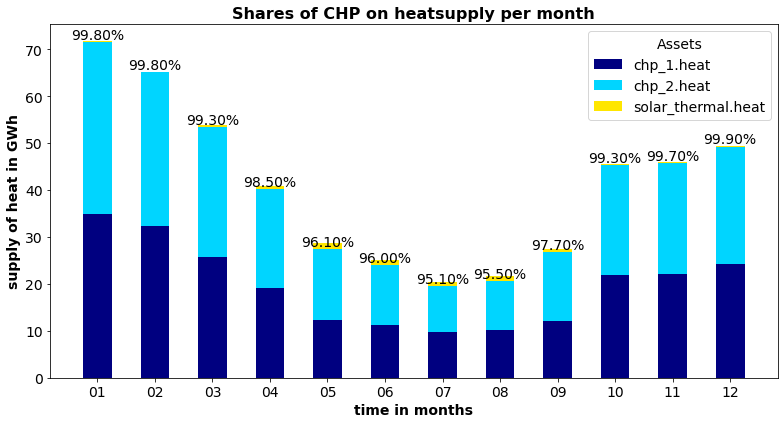

Diagramm wurde gespeichert als: ../data/postprocessing/test/share_of_assets.png


In [57]:
input_values_df = load_csv_results_in_df(input_path = INPUT_PATH)
time_sums_df = process_data(df=input_values_df, start_date = start_date, end_date = end_date, granularity=granularity, time_column=time_column)
print_df(time_sums_df)
asset_dict = calculate_asset_share_of_supply(
    asset_dict=extract_assets_to_dict(df=time_sums_df, selected_assets=all_considered_assets, type_of_energy=type_of_energy),
    type_of_energy=type_of_energy, 
    selected_assets=my_assets)

dict_for_diagrams = add_period_to_dict(df = time_sums_df, asset_dict = asset_dict)
# for key, values in dict_for_diagrams.items():
#     print(f"{key}: {values}")

asset_plot_dict = process_asset_data_for_plot(
    all_data_for_plot=dict_for_diagrams,
    actual_unit = actual_unit,
    target_unit = target_unit)
# elif granularity == 'month': 
#     months = dict_for_diagrams['period'] # Funktion einführen für Monate!
# elif granularity == 'year': 
    

plot_shares_of_supply(
    asset_dict= asset_plot_dict, 
    granularity=granularity,
    type_of_energy=type_of_energy,
    groupname=groupname,
    fontsize=fontsize,
    title_size=title_size,
    key_to_label=key_to_label,
    dict_for_diagrams = dict_for_diagrams,
    target_unit = target_unit
    )

save_diagram_as_png(
    asset_dict = asset_plot_dict,
    granularity = granularity,
    type_of_energy=type_of_energy,
    groupname = groupname,
    filename = filename,
    OUTPUT_PATH = OUTPUT_PATH,
    fontsize=fontsize,
    title_size=title_size,
    dict_for_diagrams=dict_for_diagrams,
    key_to_label=key_to_label,
    target_unit = target_unit
)

Generiere ein Diagramm über die Zeit von allen Assets und dem Bedarf sowie der Differenz, die im Speicher landet

In [55]:
# TODO: 
# 1 days and year formattieren für x-Achse
# aufräumen (Duplikate weg, Übersichtlichkeit fördern)
# Speicherbilanz unterhalb darstellen als 2. Variante

# + Darstellung Speicherbalance (- Überschuss durch Erzeugung, + Unterversorgung) zu granularität unter betrachtete Anteile als separate Version!